In [18]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math
from sklearn import cluster, datasets
from skimage import color
from sklearn import metrics
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')

In [19]:
class imageDetection:
    '''An object that will take an image with lemons in it and attempt to count the number of lemons'''
    
    def __init__(self, imagePath):
        '''Initializes the object with the image path to obtain the image'''
        self.image = self.__getImage(imagePath)
        
        # Used to identify which algorithm was used latest.
        self._recentlyUsed = None
        
        self._axes = None
        
        # Used to touch the most recent mask available
        self._recentMask = None
        imageSize = np.shape(self.image)
        
        # Reshapes the image into a 2-dimensional array the second dimension contains the RGB values
        self.reshapedImage = np.reshape(self.image,[imageSize[0]*imageSize[1],3])
        
        
    
    def showImageMask(self, opacity = -1):
        '''Attempts to show the image mask of the lemons in the provided image.
        An opacity of -1 will give the mask will be black and white, 0 < opacity <= 1 will give a reduced opacity'''
        
        if self._recentlyUsed is None:
            return
        
        if ((opacity != -1) and (opacity > 1 or opacity <= 0)):
            print("The opacity needs to be between 0 and -1")
            return
        
        if "standard" in self._recentlyUsed:
            self.__displayClustering(self.standardCluster ,opacity)
        if "dbscan" in self._recentlyUsed:
            self.__displayClustering(self.dbScan, opacity)
        return
    
    def PCADetectLemons(self, k):
        '''PCA used to obtain 2 highest variance axes, and standard kmeans++ algorithm used'''
        X = self.reshapedImage
        # Check if PCA has already been performed, saves time
        if self._axes is None:
            self._axes = PCA(n_components= 2).fit(X)
        X = self._axes.transform(X)
        
        # Transform back into 3d space so the other methods can work with this easily
        self.standardCluster = cluster.KMeans(n_clusters= k).fit(X)
        self.standardCluster.cluster_centers_= self._axes.inverse_transform(self.standardCluster.cluster_centers_)
        self._recentlyUsed = "standard"
        
        
    def dbscanDetectLemons(self, eps = 1, mask =False):
        '''Attempts to detect all the lemons using the dbscan method contained in scikit.
        Obtained from http://stackoverflow.com/questions/14088375/how-can-i-convert-rgb-to-cmyk-and-vice-versa-in-python'''
        self.dbScan = cluster.DBSCAN(eps=eps, n_jobs = -2).fit(self.reshapedImage)
        self._recentlyUsed = "dbscan"
        
        # Obtain the mask
        if(mask):
            self._recentMask = self.__mask(__yellowK(self.dbScan), self.dbScan)
        return     
    
    def dbscanLABDetectLemons(self, eps = 0.5, mask =False):
        '''Will use the DBSCAN in scikit to cluster the colours'''
        AB = self.__ObtainLabAB()
        # Increasing min_samples reduces the chance the highlights that are bang on yellow are selected.
        self.dbScan = cluster.DBSCAN(eps= eps, n_jobs = -2, min_samples = 150).fit(AB)
        print("Core Samples:", self.dbScan.core_sample_indices_)
        
        if(mask):
            self._recentMask = self.__mask(self.__yellowK(self.dbScan), self.dbScan)
        
        self._recentlyUsed = "dbscanLAB"
    
    def clusteringDetectLemons(self, K = 10, mask=False):
        '''Uses the KMeans clustering algorithm to obtain the lemons cluster'''
        self.standardCluster = cluster.KMeans(n_clusters = K, init='k-means++', n_jobs=-2).fit(self.reshapedImage)
        
        self._recentlyUsed = "standard"
        
        # Obtain the mask
        if(mask):
            self._recentMask = self.__mask(self.__yellowK(self.standardCluster), self.standardCluster)
        return    
    
    def DisplayCyanYellowPlot(self):
        tempLs = []
        for i in range(self.reshapedImage.shape[0]):
            CYList = self.__rgb_to_cmyk(self.reshapedImage[i])
            tempLs.append(CYList)
        self.cyanYellow = np.array(tempLs)
        print(self.cyanYellow.shape)
        fig = plt.figure()
        
        plt.scatter(self.cyanYellow[:,0],self.cyanYellow[:,1],s= 0.05)
        plt.xlabel("Cyan")
        plt.ylabel("Yellow")
        plt.show()
        
    def DisplayLABPlot(self):
        AB = self.__ObtainLabAB()
        
        fig = plt.figure()
        plt.scatter(AB[:,0], AB[:, 1], s= 0.05)
        plt.xlabel("A")
        plt.ylabel("B")
    
    def LABClustering(self, K, mask=False):
        AB = self.__ObtainLabAB()
        self.standardCluster = cluster.KMeans(n_clusters= K, n_jobs= -1,).fit(AB)
        
        self._recentlyUsed = "standardLab"
        
        # Obtain the mask
        if(mask):
            self._recentMask = self.__mask(self.__yellowK(self.standardCluster), self.standardCluster)
         
        
    def CountLemons(self, countType = "dbscan", plots= False):
        '''Returns the number of lemons in the image.
        countType selects which algorithm the function attempts to use to count lemons with: ["clustering", "dbscan"]
        The clustering algorithm displays the average distance from the centroid '''
        if countType != "clustering" and countType != "dbscan":
            print("The passed countType is not accepted")
            return
        
        # Check there is a mask available
        if(self._recentMask is None):
            print("You need to use a masking instance first, use one of the clustering algorithms with mask as true")
            return
        
        # Create a list of all white points and their index
        whitePointLs = self.__genWhitePointLs(plots)
        
        averageDisCentroidLs = []
        clusterList = []
        averageSilhouette = []
        X = np.array(whitePointLs)
        if countType == "clustering":
            for k in range(2,31):
                countCluster = cluster.KMeans(n_clusters= k, n_jobs= -2).fit(whitePointLs)
                clusterList.append(countCluster)
                averageSilhouette.append([metrics.silhouette_score(X, countCluster.labels_), k])
                sumVal = 0
                for index in range(0, len(whitePointLs)):
                    sumVal += np.linalg.norm(countCluster.cluster_centers_[countCluster.labels_[index], :] - whitePointLs[index])
                averageDisCentroidLs.append(sumVal/len(whitePointLs))
                
            averageSilhouette = np.array(averageSilhouette)
            maxSilIndex = np.argmax(averageSilhouette, axis = 0)[0]
            
            # Calculate the derivatives (left step method) of the average distance centroid
            derivativeLs = []
            for i in range(1, len(averageDisCentroidLs)):
                derivativeLs.append(math.fabs(averageDisCentroidLs[i] - averageDisCentroidLs[i-1]))
            
            if plots:
                # Plot information about the clusters
                fig, (ax1, ax2, ax3) =plt.subplots(nrows= 3, ncols= 1)
                ax1.scatter(range(20, 20 + len(averageDisCentroidLs)), averageDisCentroidLs)
                ax1.set_xlabel("Clusters")
                ax1.set_ylabel("Average centroid distance")
                ax1.set_title("Clusters vs Average centroid distance (Elbow method)")
            
                ax2.scatter(range(21, 21 + len(derivativeLs)), derivativeLs)
                ax2.set_ylabel("Derivatives")
                ax2.set_xlabel("Clusters")
            
                ax3.scatter(averageSilhouette[:,1], averageSilhouette[:, 0], s=0.6)
                ax3.set_title("Average Silhouette value VS K (Kmeans++ clustering)")
                ax3.set_ylabel("Average Silhouette value")
                ax3.set_xlabel("No. of clusters")
            
                plt.show()
                self.__plotClustersXY(X, clusterList[maxSilIndex].labels_)
                
            # Return the number of clusters that gave the best result.
            return averageSilhouette[maxSilIndex, 1]
            
        else:
            # Perform clustering in DBSCAN with various eps until the average silhouette is it's maximum
            # Then determine the number of labels
            initial_val = 1
            multiplier = 0
            scans = []
            # Find all the clusters for each eps value
            floatVal= 0.03
            for epsVal in range(initial_val, initial_val + 60, 1):
                scan = cluster.DBSCAN(eps= epsVal, n_jobs= -1).fit(X)
                try:
                    silVal = metrics.silhouette_score(X, scan.labels_)
                    averageSilhouette.append([epsVal, silVal])
                    scans.append(scan)
                except ValueError:
                    # If all the objects are labelled -1 then an exception will occur withing the silhouette scoring.
                    pass
                multiplier += 1
                
            # Convert to an array
            averageSilhouette = np.array(averageSilhouette)
            if plots:
                # Plot the silhouette values
                fig = plt.figure()
                plt.scatter(averageSilhouette[:, 0], averageSilhouette[:,1], s=0.6)
                plt.title("Average Silhouette value VS Eps value (DBSCAN)")

                # Obtain the max index
                maxSilIndex = np.argmax(averageSilhouette, axis= 0)[1]
                

                # Obtain the number of clusters
                labels = set(scans[maxSilIndex].labels_)
                set.difference_update(labels, set([-1]))

                self.__plotClustersXY(X, scans[maxSilIndex].labels_)
            print("The maximum silhouette value is : {:.4f}. The eps value is: {:.3f}".format(averageSilhouette[maxSilIndex, 1], 
                                                                                              averageSilhouette[maxSilIndex, 0]))
            # Returns the number of reported clusters. 
            return len(labels)
            
    def CountDBscan(self, epsVal):
        '''This method counts the number of lemons with specific parameters'''
        if(self._recentMask is None):
            print("The recent mask is uninitialized")
            return
        X = np.array(self.__genWhitePointLs(True))
        scan = cluster.DBSCAN(eps= epsVal, n_jobs= -1).fit(X)
        unique_labels = set(scan.labels_)
        set.difference_update(unique_labels, set([-1]))
        self.__plotClustersXY(X, scan.labels_)
        return len(unique_labels)
        
    
    def __plotClustersXY(self, X, labels):
        '''Will plot the labels as colors of the x y coordinate list. Modelled off of 
        http://scikit-learn.org/stable/auto_examples/cluster/plot_dbscan.html#sphx-glr-auto-examples-cluster-plot-dbscan-py'''
        uniqueLabels = set(labels)
        colors = plt.cm.Spectral(np.linspace(0, 1, len(uniqueLabels)))
        
        fig = plt.figure()
        
        for k, col in zip(uniqueLabels, colors):
            if k == -1:
                col = 'k'
                
            class_member_mask = (labels == k)
            
            xy = X[class_member_mask]
            
            plt.plot(xy[:,0], xy[:, 1], 'o', markerfacecolor=col, markeredgecolor=col, markersize=4)
        plt.title("XY colored plot for labels")
        plt.show()
        return
                
    def __getImage(self, imagePath):
        '''Return the image'''
        return mpimg.imread(imagePath) # The size is (400, 400, 3) for the lemon images
    
    def __genWhitePointLs(self, plot= False):
        whitePointLs = []
        imageSize = np.shape(self.image)
        for i in range(0, len(self._recentMask)):
            if(np.array_equal(self._recentMask[i, :], np.array([255, 255, 255]))):
                y = i % imageSize[1]
                x = math.floor(i/imageSize[0])
                whitePointLs.append([x, y])
                
        # Plotting this gives an idea of where the points are
        if(plot):
            fig = plt.figure()
            ar = np.array(whitePointLs)
            plt.scatter(ar[:,0], ar[:,1], s= 0.3)
            plt.title("The lemons points")
        return whitePointLs
        
    def __yellowK(self, clus):
        '''Returns the label for the yellow most cluster'''
        # Find the cluster corresponding to the lemon (color = yellow) and show that cluster only
        fruit_color = [216, 184, 69] # Average color in photoshop of the lemons
        
        if "standardLab" in self._recentlyUsed:
            #fruit_color = [-21, 94] # Yellow in LAB Photoshop
            fruit_color = color.rgb2lab([[[fruit_color[0]/255, fruit_color[1]/255, fruit_color[2]/255]]])
            fruit_color = fruit_color[0][0][1:3]
            print(fruit_color)

        imageSize = np.shape(self.image)
        
        labels = clus.labels_
        labSet = set(labels)
        #Ensure noise in the DBScan is not used.
        labSet.difference_update(set([-1]))
        K = len(labSet)
        
        # Keep track of the minimum distance
        mindist = math.inf
        
        # Go through each cluster and find the cluster coloured yellow
        if "standard" in self._recentlyUsed:
            for k in range(K):
                dist = np.array([])

                # Find the distance from the current cluster to the color yellow
                dist = np.linalg.norm(fruit_color - clus.cluster_centers_[k,:])
                
                # Check if this is the closest seen
                if(dist < mindist):
                    mindist = dist
                    minK = k
        else:
            print("Fruit_color", fruit_color, " Labels:", K)
            for index in range(self.reshapedImage.shape[0]):
                dist = np.linalg.norm(fruit_color - self.reshapedImage[index, :])
                if(dist < mindist):
                    # Don't bring -1 indexes
                    if(labels[index] == -1):
                        continue
                    mindist = dist
                    minK = labels[index]
                    print("Label", labels[index], " Dist:" ,dist, self.reshapedImage[index, :])
                
        
        return minK
    
    def __mask(self, kYellow, clus, opacity = -1):
        # Recreate the image as a mask
        maskTransformed = np.copy(self.reshapedImage)
        
        labels= clus.labels_
        K = list(set(labels))
        self._extraLs = []
        for k in K:

            class_member_mask = (labels == k)
            
            # Check if the current cluster is in the yellow cluster
            if k==kYellow:
                maskTransformed[class_member_mask,:] = [255, 255, 255]
                self._extraLs.append(1)
            else:
                self._extraLs.append(0)
                # Set the color of other pixels to 0 or to the opacity multiple
                if opacity == -1:
                    maskTransformed[class_member_mask,:] = [0,0,0]
                else:
                    maskTransformed[class_member_mask,:] = maskTransformed[class_member_mask,:]*opacity
        return maskTransformed
        
    def __showImage(self, image):
        '''Takes an image and displays it'''
        # Create a new figure to make sure not to erase the old one
        fig = plt.figure()
        plt.imshow(image)
        plt.show()
    
    def __displayClustering(self, clus, opacity):
        
        kYellow = self.__yellowK(clus)
        
        maskTransformed = self.__mask(kYellow, clus, opacity)
        
        imageSize = np.shape(self.image)
        
        # Reshape the mask so the image can be displayed
        imgc = np.reshape(maskTransformed, [imageSize[0], imageSize[1],3])
        
        self.__showImage(imgc)

        
    def __rgb_to_cmyk(self, *row):
        '''Converts RGB to CMYK but drops Magenta and Black '''
        
        cmyk_scale = 1
        
        row = np.asarray(row)[0]
        if (row[0] == 0) and (row[1] == 0) and (row[2] == 0):
            # black
            return [0, 0]

        # rgb [0,255] -> cmy [0,1]
        c = 1 - row[0] / 255.
        m = 1 - row[1] / 255.
        y = 1 - row[2] / 255.

        # extract out k [0,1]
        min_cmy = min(c, m, y)
        c = (c - min_cmy) / (1 - min_cmy)
        m = (m - min_cmy) / (1 - min_cmy)
        y = (y - min_cmy) / (1 - min_cmy)
        k = min_cmy

        # rescale to the range [0,cmyk_scale]
        return [c*cmyk_scale, y*cmyk_scale]
        

    def __ObtainLabAB(self):
        '''Will return the 2D array of the image's A and B values in the LAB colour space.
        In this colour space A and B contain all the information about colour.
        '''
        lab = color.rgb2lab(self.image)
        imageSize = np.shape(lab)
        labTransformed = np.reshape(lab, [imageSize[0]*imageSize[1],3])
        AB = labTransformed[:, 1:3]
        return AB


(160000, 2)


<IPython.core.display.Javascript object>


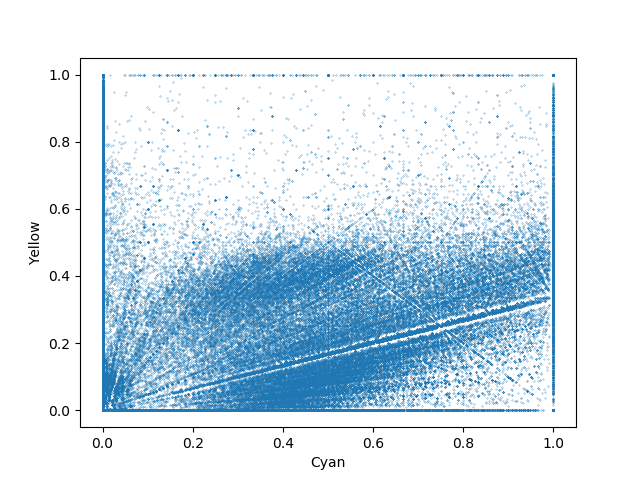

<IPython.core.display.Javascript object>


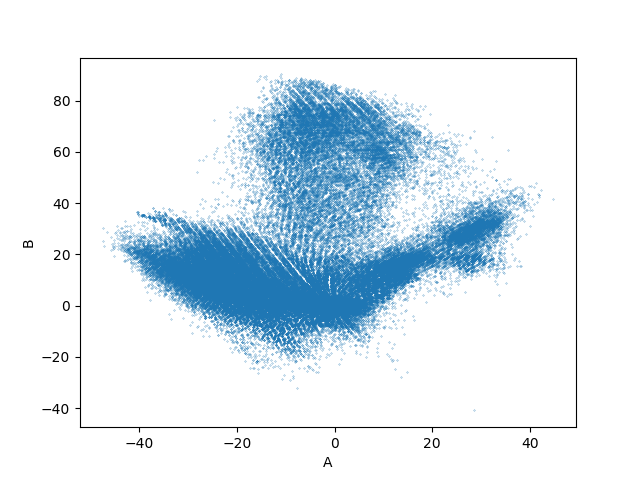

In [20]:
%matplotlib notebook
lemOne = imageDetection('lemon_count.jpg')
lemOne.DisplayCyanYellowPlot()
lemOne.DisplayLABPlot()

[ -0.9409029   60.30127243]


<IPython.core.display.Javascript object>


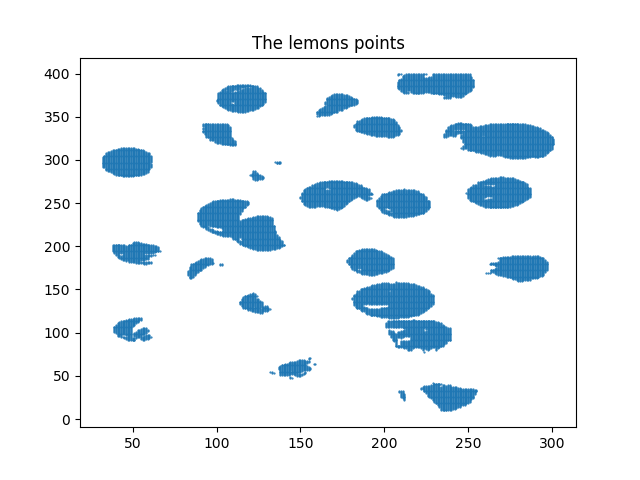

<IPython.core.display.Javascript object>


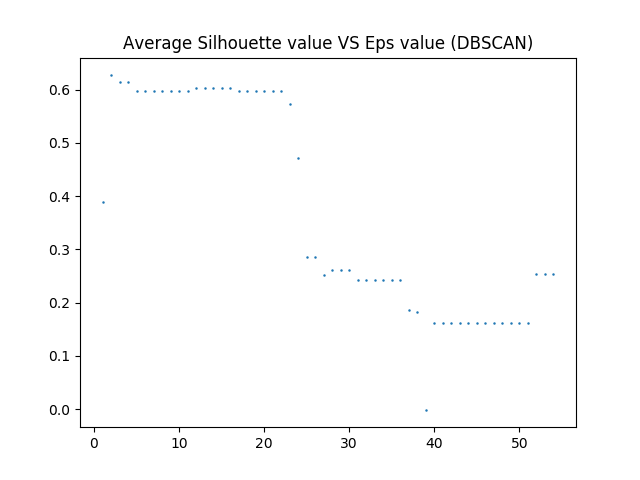

<IPython.core.display.Javascript object>


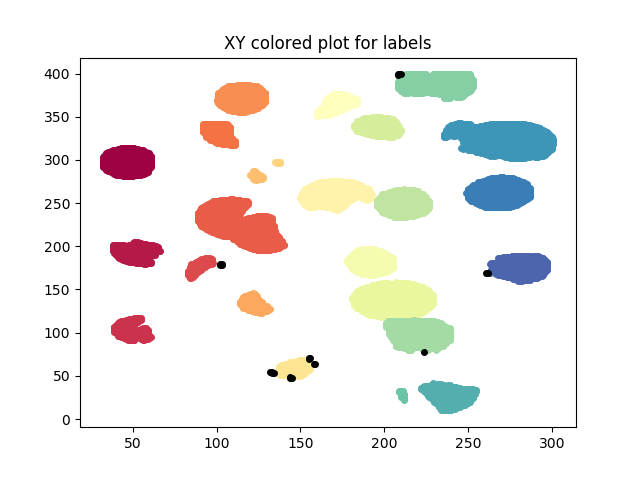

The maximum silhouette value is : 0.6274. The eps value is: 2.000


In [21]:
lemOne.LABClustering(4, mask= True)
clustersTotal = lemOne.CountLemons(plots=True)

In [22]:
print("The total number of lemons via DBSCAN is {:d}".format(clustersTotal))

The total number of lemons via DBSCAN is 24


[ -0.9409029   60.30127243]


<IPython.core.display.Javascript object>


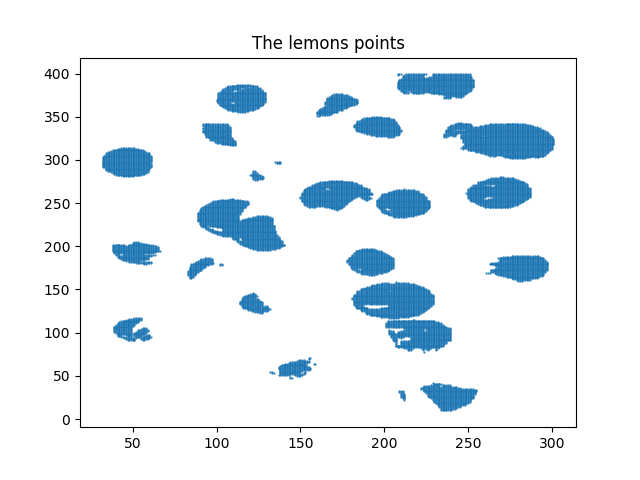

<IPython.core.display.Javascript object>


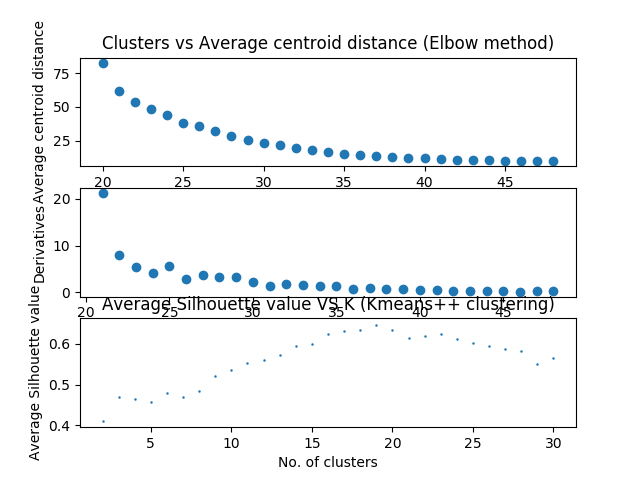

<IPython.core.display.Javascript object>


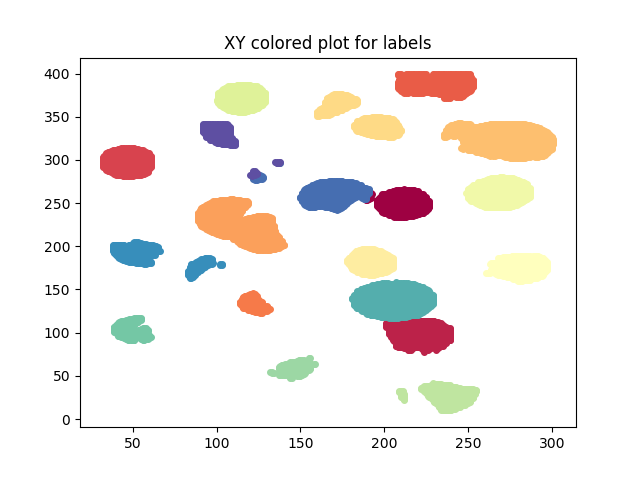

In [23]:
lemOne.LABClustering(4, mask= True)
clustersTotal = lemOne.CountLemons(countType="clustering", plots= True)

In [7]:
print("The total number of lemons via Kmeans is {:f}".format(clustersTotal))

The total number of lemons via Kmeans is 19.000000


# Second Image
Using the parameters of the previous image and the best algorithms discovered to work with the previous image, the new image will have it's lemons counted.

In [8]:
lemTwo = imageDetection("lemon_count2.jpg")

[ -0.9409029   60.30127243]
[ -0.9409029   60.30127243]


<IPython.core.display.Javascript object>


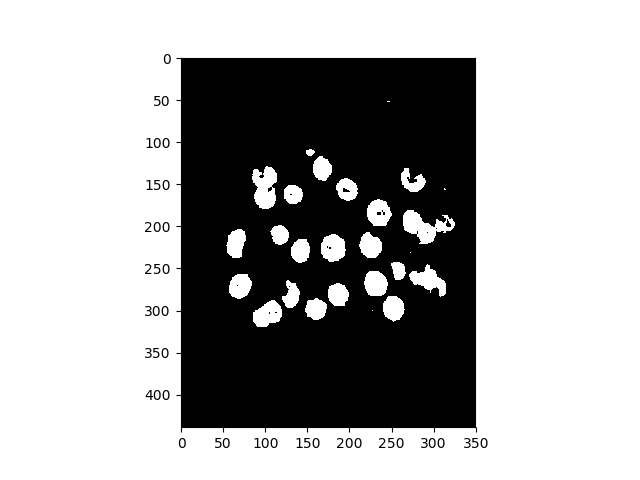

<IPython.core.display.Javascript object>


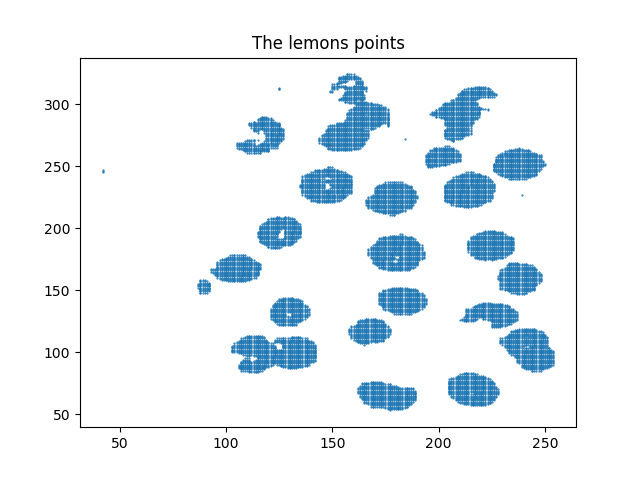

<IPython.core.display.Javascript object>


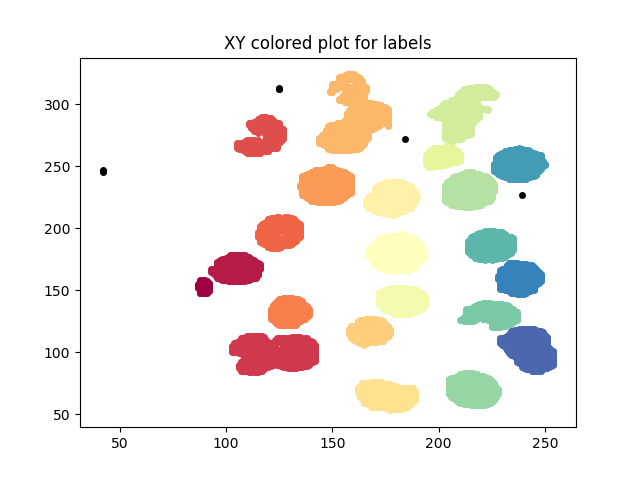

This gives: 22 clusters the true number is 29 not including green lemons


In [9]:
%matplotlib notebook
# The best K value was 4 using the LAB color space and the Kmeans++ clustering algorithm
lemTwo.LABClustering(K=4, mask=True)
lemTwo.showImageMask(opacity = -1)
numberOfClusters = lemTwo.CountDBscan(epsVal=3.0)
print("This gives: {:d} clusters the true number is 29 not including green lemons".format(numberOfClusters))

In [10]:
print("Using the previous images best dbscan parameters parameters the number of lemons predicted is: {}".format(numberOfClusters))

Using the previous images best dbscan parameters parameters the number of lemons predicted is: 22


## My algorithm

<IPython.core.display.Javascript object>


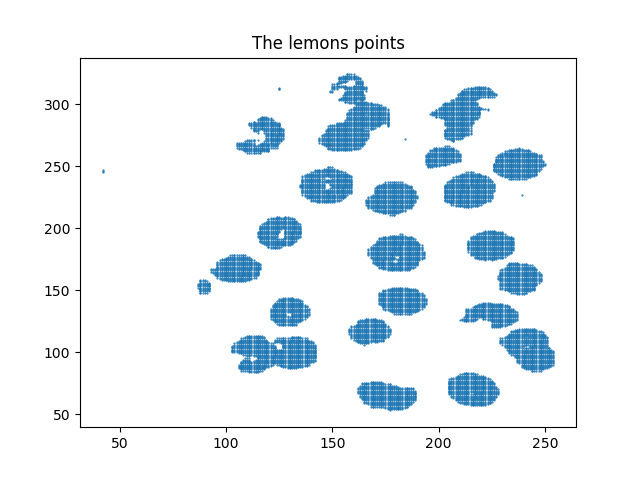

<IPython.core.display.Javascript object>


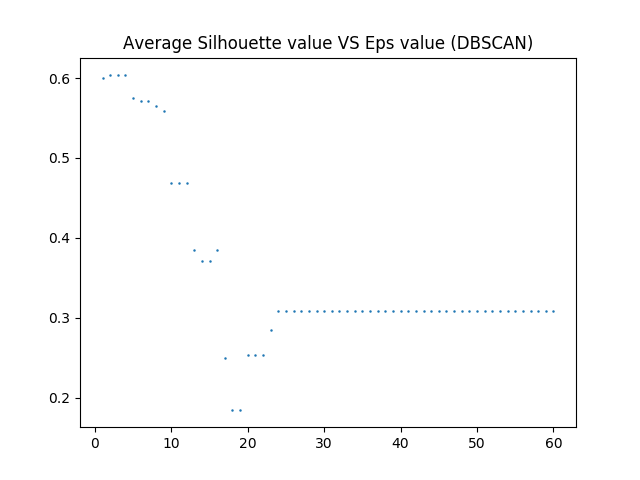

<IPython.core.display.Javascript object>


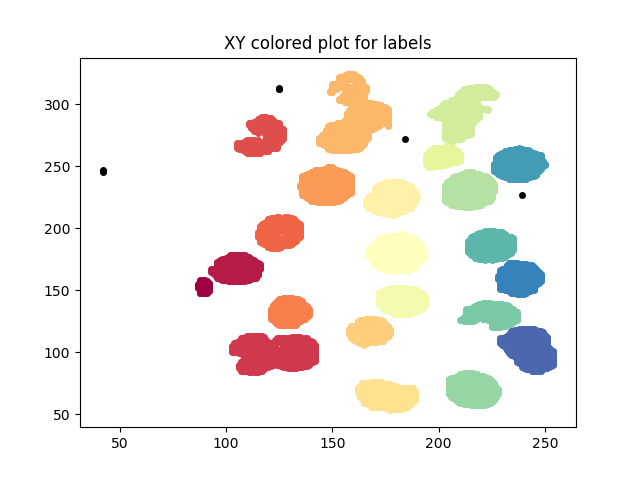

The maximum silhouette value is : 0.6036. The eps value is: 2.000


22

In [11]:
lemTwo.CountLemons(plots= True)

# My Exploratory Data Analysis
This is my experimentation to generate my best methods above.

<IPython.core.display.Javascript object>


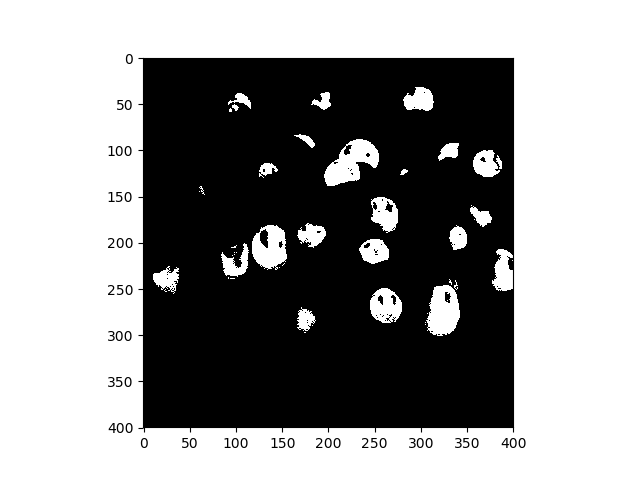

Fruit_color [216, 184, 69]  Labels: 4791
Label 0  Dist: 255.912094282 [15 31 28]
Label 1  Dist: 157.851195751 [124  57  51]
Label 10  Dist: 96.30160954 [177  96  66]
Label 133  Dist: 94.9578854019 [178  97  67]
Label 315  Dist: 88.4816365129 [183 102  73]
Label 1187  Dist: 82.9638475482 [183 109  82]
Label 1228  Dist: 55.5517776493 [253 225  63]
Label 1314  Dist: 49.578221025 [253 217  69]
Label 2610  Dist: 19.3390796058 [230 187  56]


<IPython.core.display.Javascript object>


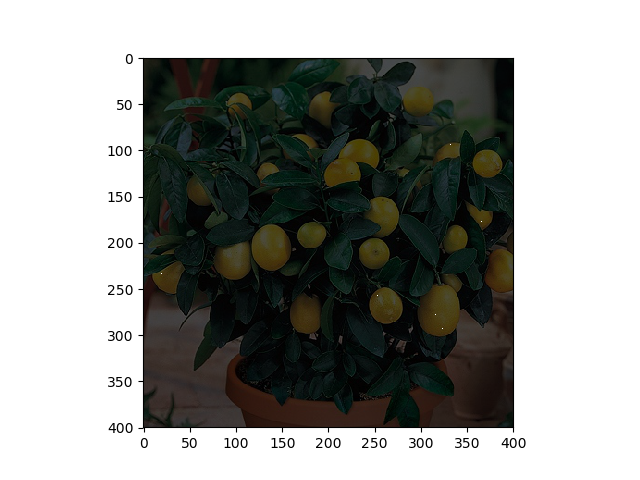

In [12]:
lemOne.clusteringDetectLemons()
lemOne.showImageMask()

lemOne.dbscanDetectLemons(0.05)
lemOne.showImageMask(opacity=0.3)

K value:  2


<IPython.core.display.Javascript object>


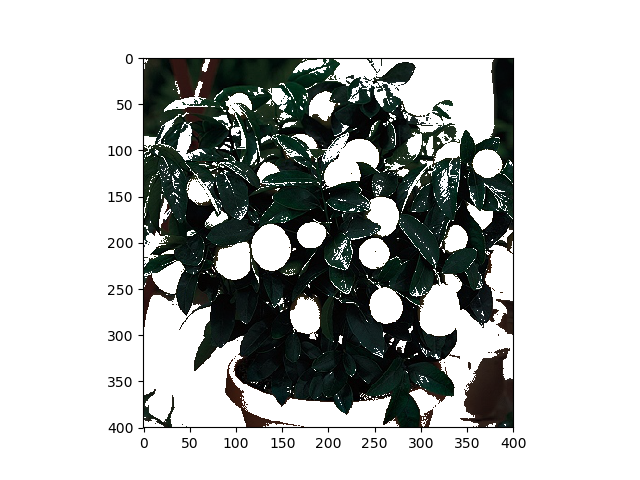

K value:  3


<IPython.core.display.Javascript object>


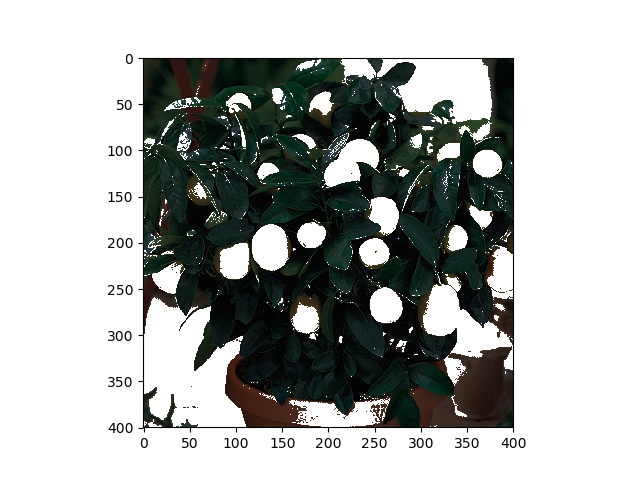

K value:  4


<IPython.core.display.Javascript object>


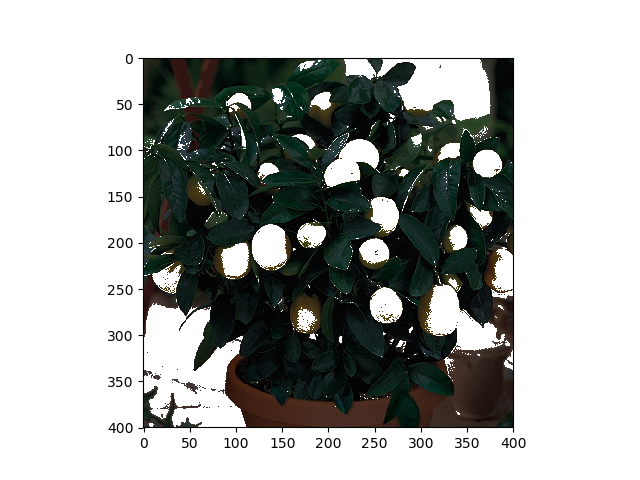

K value:  5


<IPython.core.display.Javascript object>


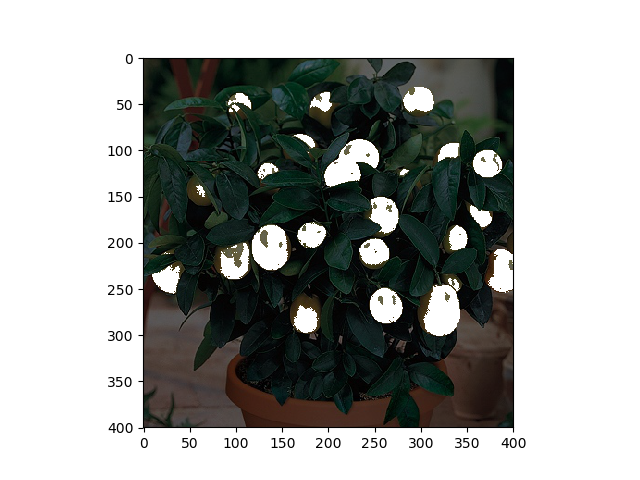

K value:  6


<IPython.core.display.Javascript object>


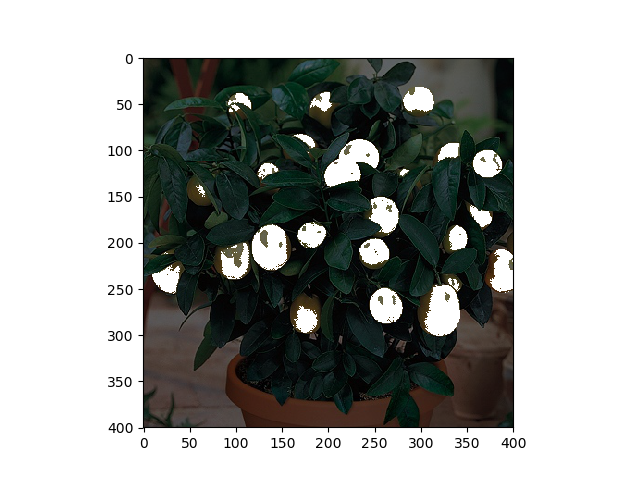

K value:  7


<IPython.core.display.Javascript object>


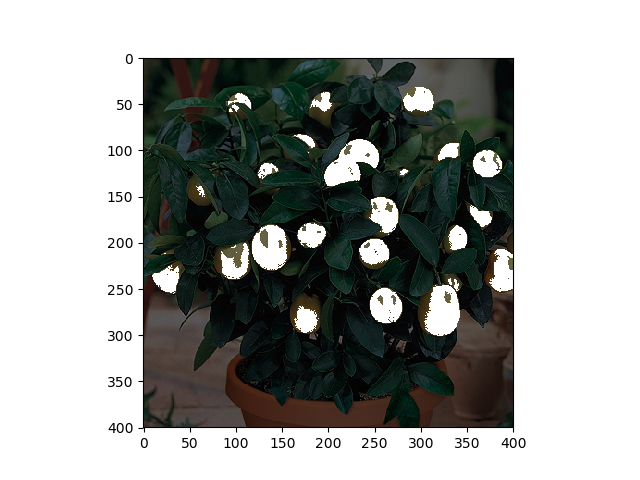

K value:  8


<IPython.core.display.Javascript object>


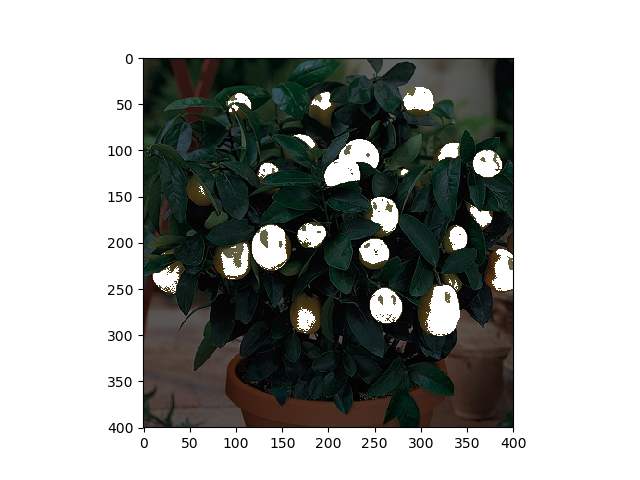

K value:  9


<IPython.core.display.Javascript object>


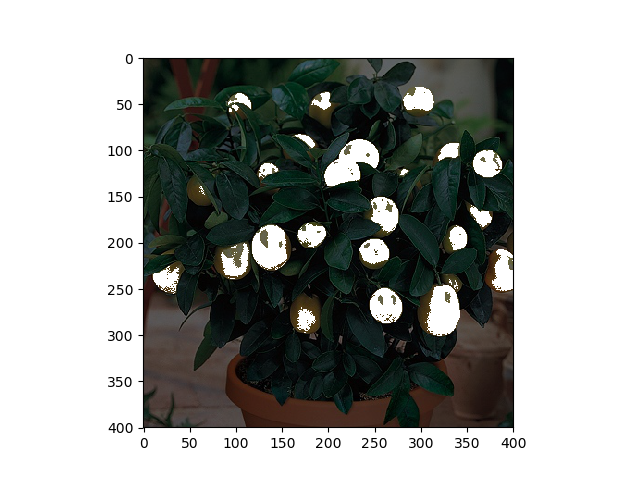

In [13]:
'''Using Kmeans Clustering'''
for k in range(2, 10):
    print("K value: ", k)
    lemOne.clusteringDetectLemons(K=k)
    lemOne.showImageMask(opacity = 0.4)

The clustering appears to do much better with low values of clusters.

Fruit_color [216, 184, 69]  Labels: 191
Label 0  Dist: 102.259473889 [136 125  93]
Label 0  Dist: 96.30160954 [177  96  66]
Label 0  Dist: 92.146622293 [135 155 102]
Label 0  Dist: 85.7263086806 [144 162 110]
Label 0  Dist: 84.1546195999 [149 167 117]
Label 0  Dist: 82.1218606706 [154 170 121]
Label 0  Dist: 79.0569415042 [165 177 129]
Label 0  Dist: 77.6852624376 [191 175 142]
Label 0  Dist: 75.3325958666 [185 169 136]
Label 0  Dist: 74.8531896448 [183 167 134]
Label 0  Dist: 74.0337760755 [184 165 133]
Label 0  Dist: 73.8782782691 [183 164 132]
Label 0  Dist: 63.9140047251 [250 232  94]
Label 0  Dist: 56.4092191047 [247 229  83]
Label 0  Dist: 42.7317212384 [243 200  98]
Label 0  Dist: 41.1582312545 [239 202  98]
Label 26  Dist: 35.8329457343 [224 198 101]
Label 0  Dist: 35.5808937493 [247 200  62]
Label 0  Dist: 34.3074335968 [246 193  55]
Label 0  Dist: 32.1558703816 [243 201  65]
Label 0  Dist: 20.0499376558 [221 195  85]
Label 0  Dist: 8.54400374532 [215 190  63]
Label 0  Dist: 8

<IPython.core.display.Javascript object>


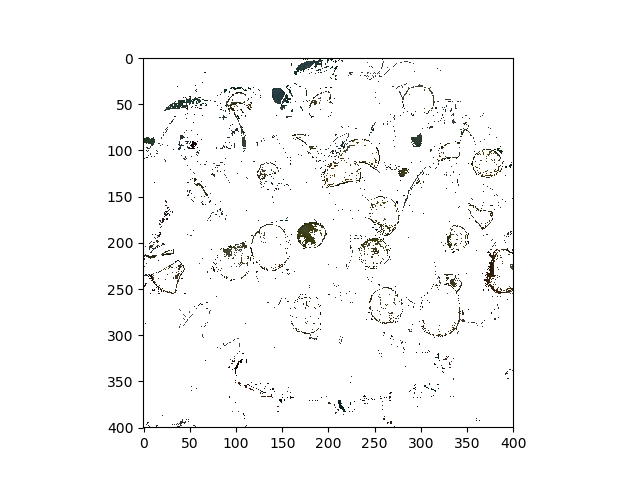

In [14]:
lemOne.dbscanDetectLemons(eps= 4)
lemOne.showImageMask(opacity= 0.3)

## 3D DBscan observations
I am observing that the dbscan is extremely sensitive. Either the eps value is to low and a very select group of pixels are identified, or every pixel is selected. I could use PCA to obtain a better selection. Using Standard Scaler is another option.

## LAB Mode
http://au.mathworks.com/help/images/examples/color-based-segmentation-using-k-means-clustering.html?requestedDomain=au.mathworks.com
In this document they discuss how LAB mode has all the colour information within a and b. This means the clustering algorithm will be able to work with just the colour information, using photoshop the lemons do appear a lot more seperated using this method.

### LAB vs CMYK plot conclusions
Looking at the plots of Yellow vs Cyan, and A vs B from LAB conversion the A and B results appear to be considerably seperated. It will of benefit if the top lobe is the lemons. Photoshop tells me that b values for lemons is quite high, this looks promising

2
[ -0.9409029   60.30127243]


<IPython.core.display.Javascript object>


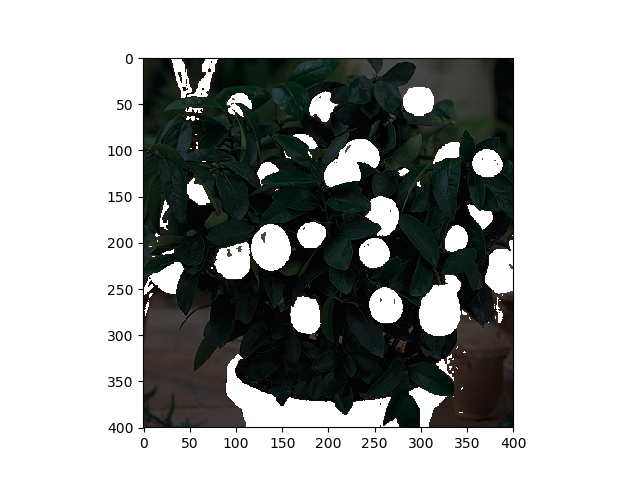

3
[ -0.9409029   60.30127243]


<IPython.core.display.Javascript object>


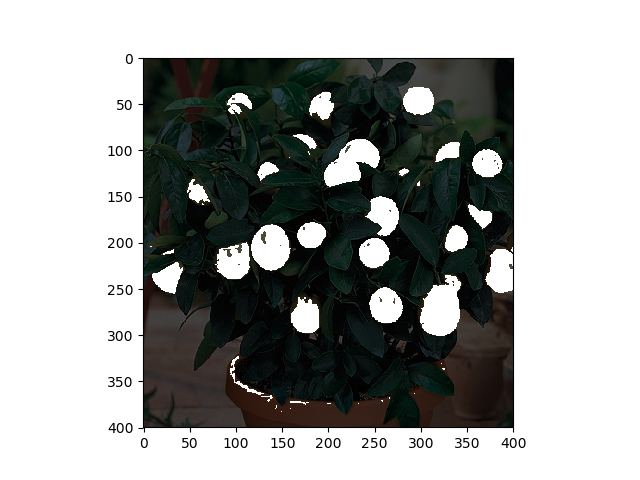

4
[ -0.9409029   60.30127243]


<IPython.core.display.Javascript object>


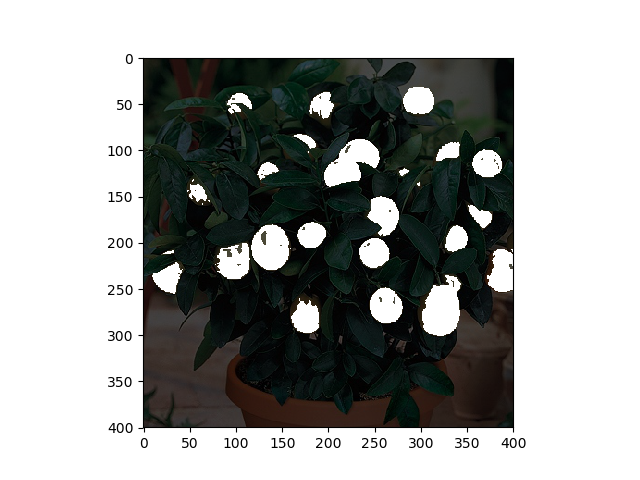

5
[ -0.9409029   60.30127243]


<IPython.core.display.Javascript object>


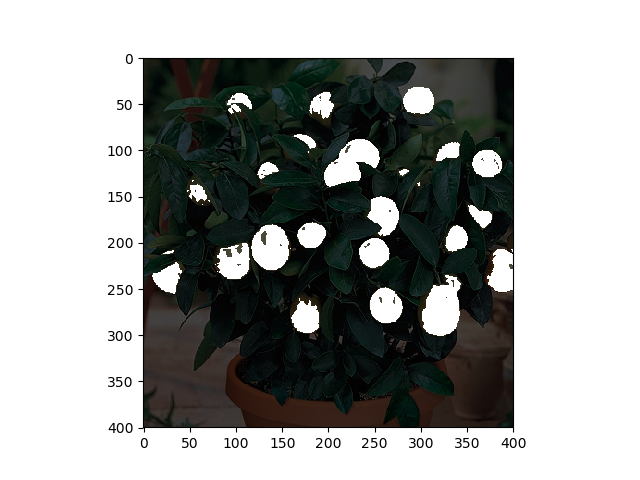

7
[ -0.9409029   60.30127243]


<IPython.core.display.Javascript object>


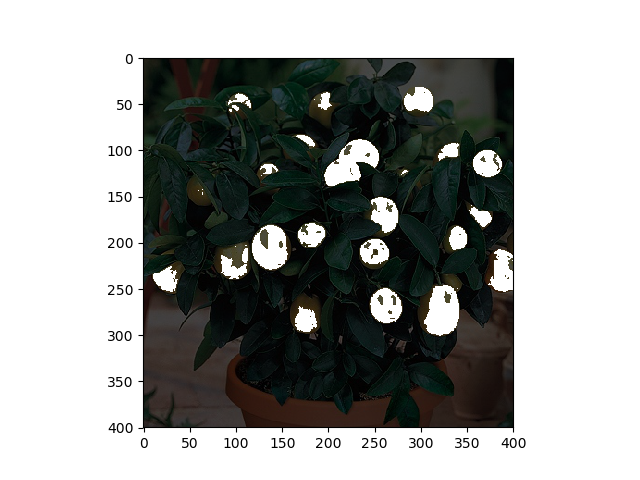

10
[ -0.9409029   60.30127243]


<IPython.core.display.Javascript object>


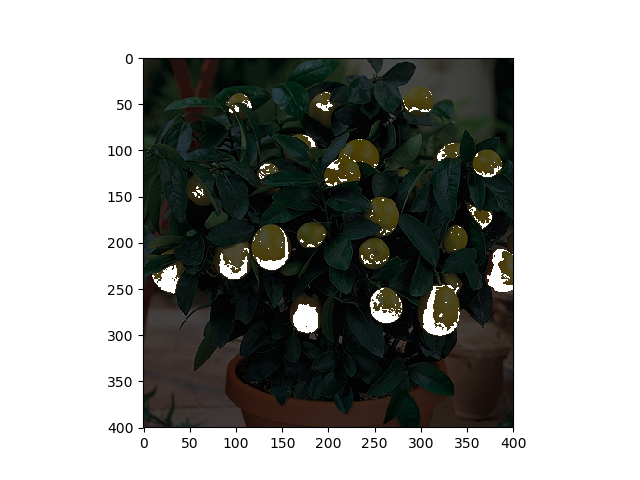

15
[ -0.9409029   60.30127243]


<IPython.core.display.Javascript object>


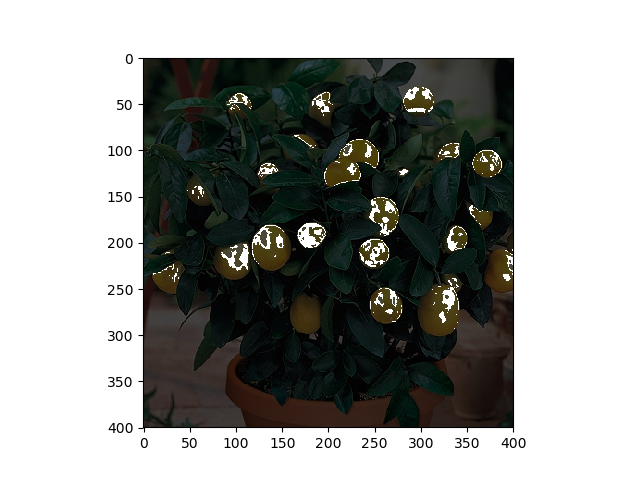

20
[ -0.9409029   60.30127243]


<IPython.core.display.Javascript object>


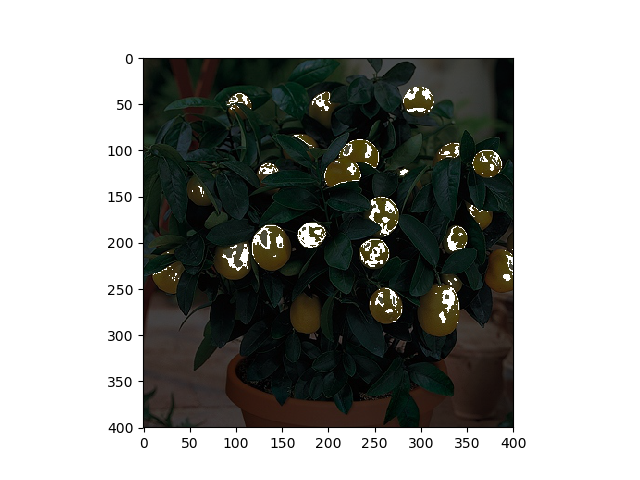

In [15]:
for i in [2,3,4,5,7,10,15,20]:
    print(i)
    lemOne.LABClustering(i)
    lemOne.showImageMask(opacity=0.3)

number of clusters: 2


<IPython.core.display.Javascript object>


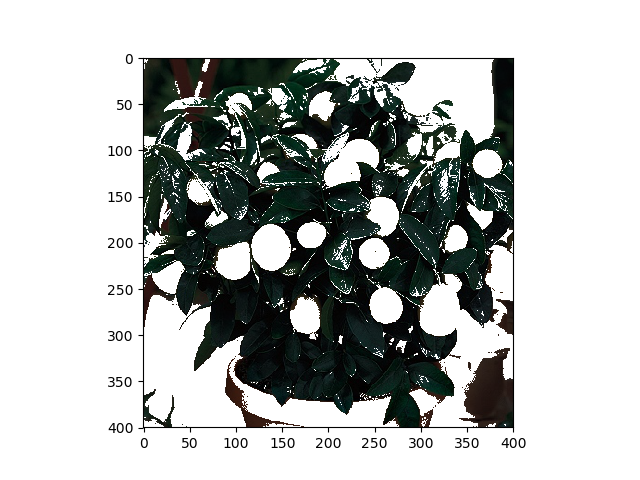

number of clusters: 3


<IPython.core.display.Javascript object>


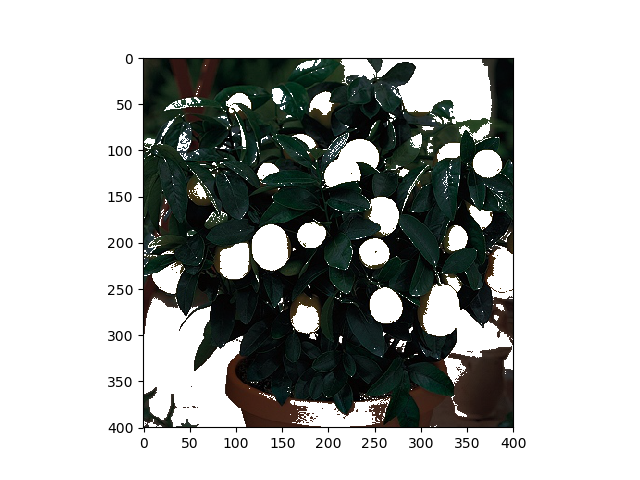

number of clusters: 4


<IPython.core.display.Javascript object>


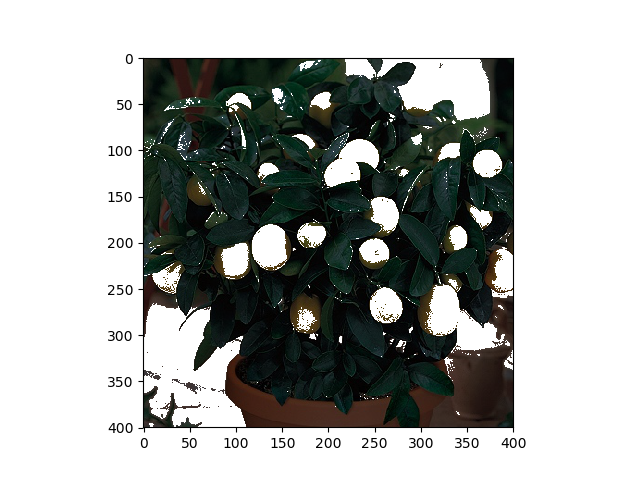

number of clusters: 5


<IPython.core.display.Javascript object>


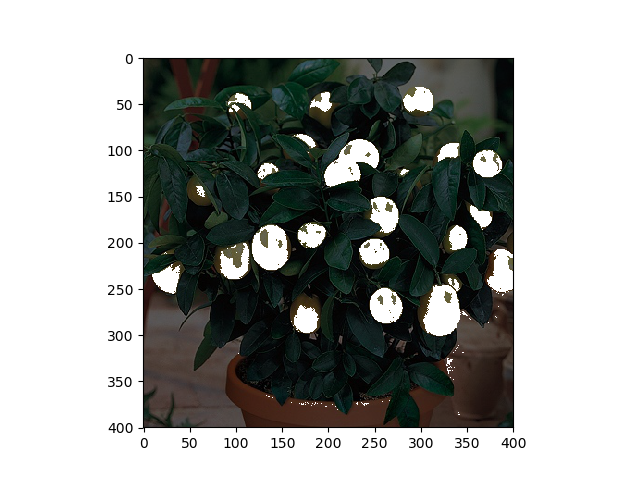

number of clusters: 6


<IPython.core.display.Javascript object>


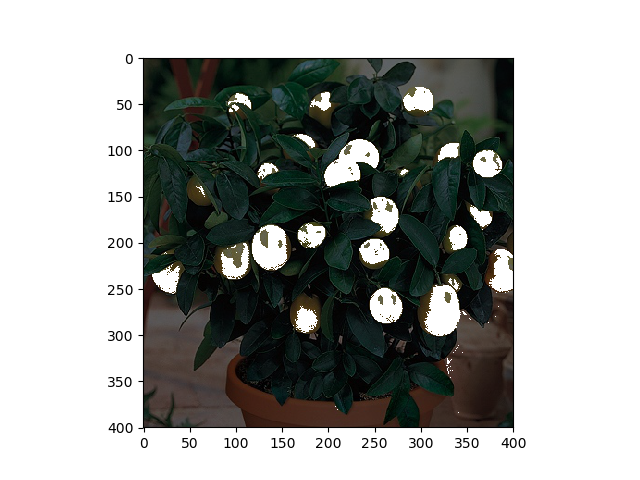

number of clusters: 10


<IPython.core.display.Javascript object>


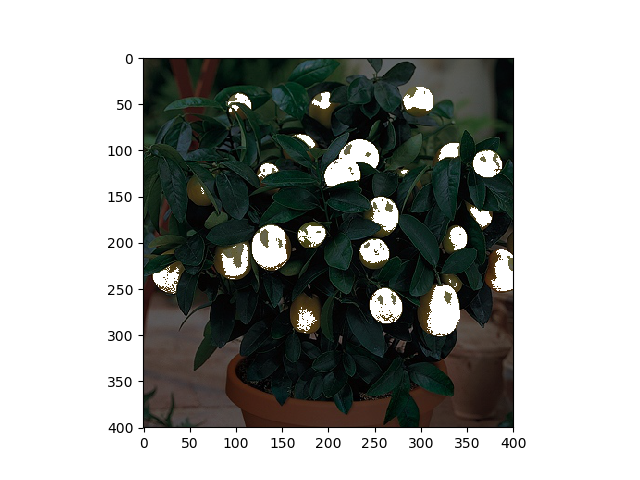

number of clusters: 15


<IPython.core.display.Javascript object>


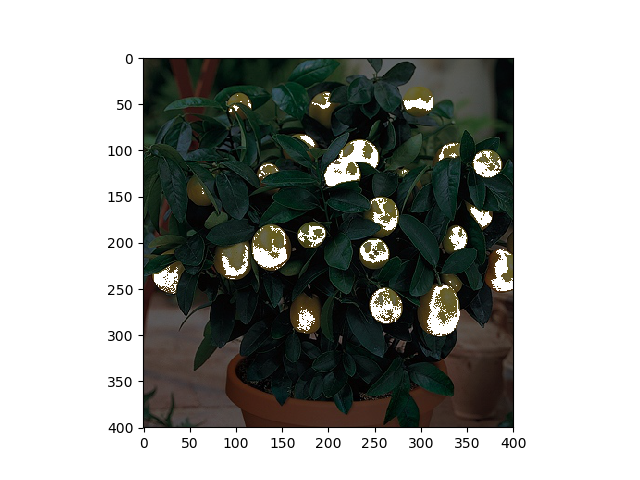

In [16]:
'''Perform the Kmeans++ algorithm on a PCA transformed '''
for k in [2, 3, 4, 5, 6, 10, 15]:
    print("number of clusters: {}".format(k))
    lemOne.PCADetectLemons(k=k)
    lemOne.showImageMask(opacity=0.4)

2.1
Core Samples: [     1      2      3 ..., 159997 159998 159999]
Fruit_color [216, 184, 69]  Labels: 4
Label 0  Dist: 93.8988817825 [142 134  98]
Label 0  Dist: 92.146622293 [135 155 102]
Label 0  Dist: 85.7263086806 [144 162 110]
Label 0  Dist: 84.1546195999 [149 167 117]
Label 0  Dist: 82.1218606706 [154 170 121]
Label 0  Dist: 79.0569415042 [165 177 129]
Label 0  Dist: 77.6852624376 [191 175 142]
Label 0  Dist: 75.3325958666 [185 169 136]
Label 0  Dist: 74.8531896448 [183 167 134]
Label 0  Dist: 74.0337760755 [184 165 133]
Label 0  Dist: 73.8782782691 [183 164 132]
Label 1  Dist: 63.9140047251 [250 232  94]
Label 1  Dist: 56.4092191047 [247 229  83]
Label 1  Dist: 41.1582312545 [239 202  98]
Label 1  Dist: 35.8329457343 [224 198 101]
Label 1  Dist: 23.5372045919 [199 187  85]
Label 1  Dist: 20.0499376558 [221 195  85]
Label 1  Dist: 8.54400374532 [215 190  63]
Label 1  Dist: 8.12403840464 [212 179  74]
Label 1  Dist: 1.41421356237 [216 183  68]


<IPython.core.display.Javascript object>


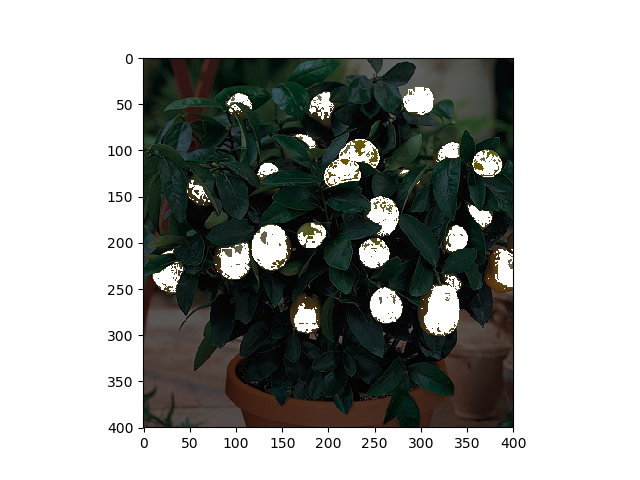

2.2
Core Samples: [     1      2      3 ..., 159997 159998 159999]
Fruit_color [216, 184, 69]  Labels: 3
Label 0  Dist: 93.8988817825 [142 134  98]
Label 0  Dist: 92.146622293 [135 155 102]
Label 0  Dist: 85.7263086806 [144 162 110]
Label 0  Dist: 84.1546195999 [149 167 117]
Label 0  Dist: 82.1218606706 [154 170 121]
Label 0  Dist: 79.0569415042 [165 177 129]
Label 0  Dist: 77.6852624376 [191 175 142]
Label 0  Dist: 75.3325958666 [185 169 136]
Label 0  Dist: 74.8531896448 [183 167 134]
Label 0  Dist: 74.0337760755 [184 165 133]
Label 0  Dist: 73.8782782691 [183 164 132]
Label 1  Dist: 63.9140047251 [250 232  94]
Label 1  Dist: 56.4092191047 [247 229  83]
Label 1  Dist: 42.7317212384 [243 200  98]
Label 1  Dist: 41.1582312545 [239 202  98]
Label 1  Dist: 35.8329457343 [224 198 101]
Label 1  Dist: 23.5372045919 [199 187  85]
Label 1  Dist: 20.0499376558 [221 195  85]
Label 1  Dist: 8.54400374532 [215 190  63]
Label 1  Dist: 8.12403840464 [212 179  74]
Label 1  Dist: 1.41421356237 [216 18

<IPython.core.display.Javascript object>


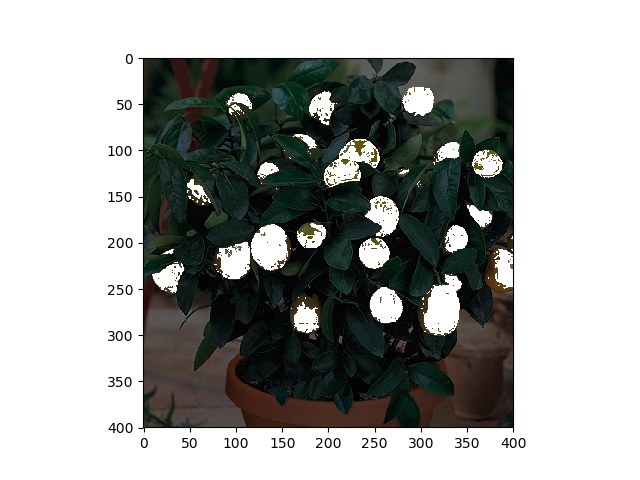

2.3
Core Samples: [     0      1      2 ..., 159997 159998 159999]
Fruit_color [216, 184, 69]  Labels: 2
Label 0  Dist: 93.8988817825 [142 134  98]
Label 0  Dist: 92.146622293 [135 155 102]
Label 0  Dist: 85.7263086806 [144 162 110]
Label 0  Dist: 84.1546195999 [149 167 117]
Label 0  Dist: 82.1218606706 [154 170 121]
Label 0  Dist: 79.0569415042 [165 177 129]
Label 0  Dist: 77.6852624376 [191 175 142]
Label 0  Dist: 75.3325958666 [185 169 136]
Label 0  Dist: 74.8531896448 [183 167 134]
Label 0  Dist: 74.0337760755 [184 165 133]
Label 0  Dist: 73.8782782691 [183 164 132]
Label 1  Dist: 63.9140047251 [250 232  94]
Label 1  Dist: 56.4092191047 [247 229  83]
Label 1  Dist: 42.7317212384 [243 200  98]
Label 1  Dist: 41.1582312545 [239 202  98]
Label 1  Dist: 35.8329457343 [224 198 101]
Label 1  Dist: 23.5372045919 [199 187  85]
Label 1  Dist: 20.0499376558 [221 195  85]
Label 1  Dist: 8.54400374532 [215 190  63]
Label 1  Dist: 8.12403840464 [212 179  74]
Label 1  Dist: 1.41421356237 [216 18

<IPython.core.display.Javascript object>


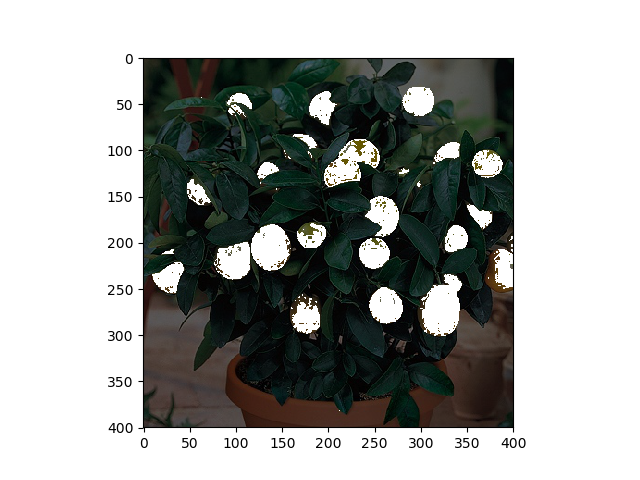

2.35
Core Samples: [     0      1      2 ..., 159997 159998 159999]
Fruit_color [216, 184, 69]  Labels: 1
Label 0  Dist: 93.8988817825 [142 134  98]
Label 0  Dist: 92.146622293 [135 155 102]
Label 0  Dist: 85.7263086806 [144 162 110]
Label 0  Dist: 84.1546195999 [149 167 117]
Label 0  Dist: 82.1218606706 [154 170 121]
Label 0  Dist: 79.0569415042 [165 177 129]
Label 0  Dist: 77.6852624376 [191 175 142]
Label 0  Dist: 75.3325958666 [185 169 136]
Label 0  Dist: 74.8531896448 [183 167 134]
Label 0  Dist: 74.0337760755 [184 165 133]
Label 0  Dist: 73.8782782691 [183 164 132]
Label 0  Dist: 63.9140047251 [250 232  94]
Label 0  Dist: 56.4092191047 [247 229  83]
Label 0  Dist: 42.7317212384 [243 200  98]
Label 0  Dist: 41.1582312545 [239 202  98]
Label 0  Dist: 35.8329457343 [224 198 101]
Label 0  Dist: 23.5372045919 [199 187  85]
Label 0  Dist: 20.0499376558 [221 195  85]
Label 0  Dist: 8.54400374532 [215 190  63]
Label 0  Dist: 8.12403840464 [212 179  74]
Label 0  Dist: 1.41421356237 [216 1

<IPython.core.display.Javascript object>


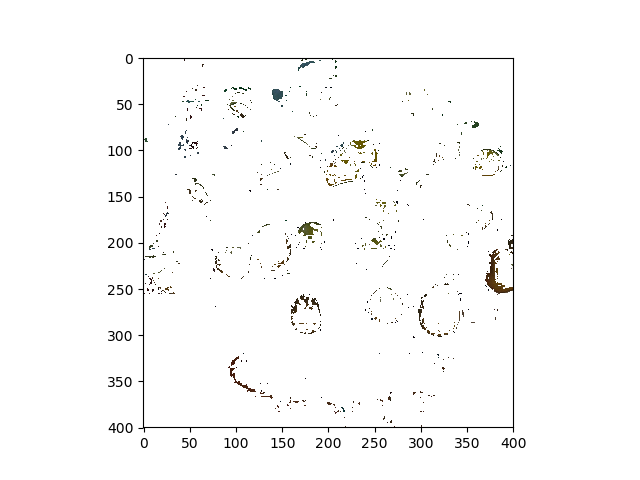

In [17]:
for i in [2.1, 2.2, 2.3, 2.35]:
    print(i)
    lemOne.dbscanLABDetectLemons(eps= i)
    lemOne.showImageMask(opacity= 0.4)

#### DBSCAN conclusion and observations
DBSCAN is a difficult algorithm, trying to figure out what to set eps to is quite difficult. Too high and the image gets entirely selected, to low and not enough lemon pixels are selected. I used a lot of time in determining a method to obtain how close the cluster is to the color yellow. I tried mean and median methods first, however these tended to give values that are much closer to gray and I was not sure whether this was due to eps value or the method I was determining to determine center, so I used whichever label that was not -1 and had a point really close to the yellow rgb values.

An eps value of 2.0 - 3.0 gave the best results. However the highlighted pixels are not as consistent as that of the clustering algorithm.